# 연예인 닮은꼴 찾기

In [1]:
#-*- encoding: utf8 -*-

In [2]:
import tensorflow as tf
tf.config.list_physical_devices('GPU')

[]

### 데이터셋 다운받기

연예인 데이터셋을 받아와 압축을 간단히 풀겠습니다.

사용한 모듈
- `wget`
- `tarfile`

In [3]:
### 한국 유명인 얼굴 데이터셋을 받아옵니다. ###
# orin_url = 'https://drive.google.com/uc?export=download&id='
# url = orin_url + "1SCNlkW3l9bzsGhzFVk8DmNdfq9D-sey2"
# print(url)
# file_name = wget.download(url, out='./data')
# import wget

In [4]:
# import os
# dir_path = os.getenv("HOME") + "/aiffel/exploration-5-face-recognition/data"
# zip_path = os.path.join(dir_path, 'celebrity.tar.xz')
# print(zip_path)

In [5]:
# ### 압축 풀기
# import tarfile
# def extract_file(fname, to_directory="/../"):
#     with tarfile.open(fname) as f:
#         f.extractall(to_directory)

## 상위 경로 불러오는 법2
## os.path.abspath(os.path.join(file_path, "..")

In [6]:
# extract_file(zip_path, dir_path)

In [97]:
import os 
import matplotlib.pyplot as plt
import matplotlib.image as img
import numpy as np
import face_recognition
from tqdm import tqdm 
from PIL import Image
import cv2

In [8]:
dir_path = os.getenv("HOME") + "/aiffel/exploration-5-face-recognition/data"

In [9]:
file_path =  os.path.join(dir_path, 'celebrity')
file_list = os.listdir(file_path)
file_list = [file for file in file_list if file != ".ipynb_checkpoints"]

In [10]:
print(f"There are {len(file_list)} images.")

There are 292 images.


파일이름이 겹치는 경우가 있을 수 있어 아래와 같이 체크를 했습니다. 처음에는 `박진영.jpeg`, `박진영.jpg`와 같은 경우로 파일명이 되어있어서 갯수를 세는데에 차이가 있을 것 같아 동일인의 사진인 경우 직접 파일 이름을 수정해 숫자를 붙여 구분했습니다.

In [11]:
# file_names = []
# for file in file_list:
#     name = os.path.splitext(file)[0]
#     file_names.append(name)

In [12]:
# file_name_set = set(file_names)

In [13]:
# print(len(file_name_set))
# print(len(file_names))

In [14]:
# for name in file_names:
#     if file_names.count(name) > 1:
#         print(name, file_names.count(name))

총 292장의 사진이 있습니다. `.ipynb_checkpoints`로 저장되는 주피터노트북의 체크포인트를 미리 제외하고 수희퍼실님께서 올려주신 연예인 사진에 추가적으로 비교하기 위해 제 사진을 포함해 몇장의 사진을 추가했습니다. 

시각화를 할 때 한글폰트를 사용할 수 있게 아래와 같이 설정을 해주겠습니다. 

In [15]:
## 한글폰트 사용##
import matplotlib as mpl
import matplotlib.font_manager as fm  # 폰트 관련 용도
font_list = fm.findSystemFonts(fontpaths=None, fontext='ttf')
# print(font_list)

# font_list에서 설치된 폰트를 확인 후에 사용하고자 하는 폰트를 적어줍니다.
fontpath = '/usr/share/fonts/truetype/nanum/NanumGothic.ttf' 

font_name = fm.FontProperties(fname=fontpath, size=10).get_name()
plt.rc('font', family=font_name)  

fm._rebuild()
mpl.rcParams['axes.unicode_minus'] = False

matplotlib의 `imread`로 읽을 경우에 .png 파일을 읽지 못하는 경우가 있어서 PIL을 통해서 읽도록 수정해줬습니다.

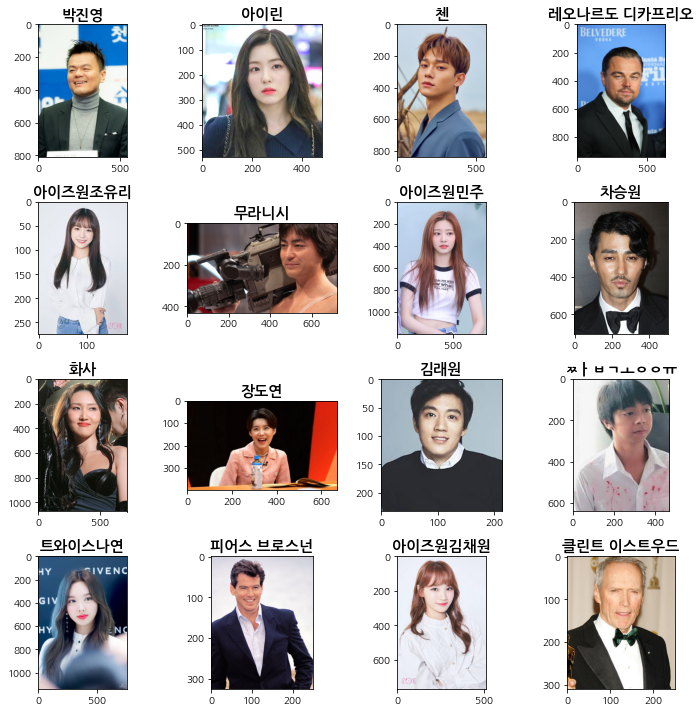

In [16]:
fig, axes = plt.subplots(nrows=4, ncols=4, figsize=(10, 10))
axs = axes.ravel()

rng = np.random.default_rng(89)
idxs = rng.choice(len(file_list), 16, replace=False)
for i, ax in enumerate(axs):
    idx = idxs[i]
    file = os.path.join(file_path, file_list[idx])
    name = os.path.splitext(file_list[idx])[0]
    image = Image.open(file)
    ax.imshow(image)
    ax.set_title(f"{name}", fontsize=15, fontweight='bold')
    
fig.tight_layout()

사진의 이름에서 `짭공유`로 나와야되는 부분이 깨져서 나옵니다. 이 부분 관련해서는 파일 저장방식과 관련이 있습니다. 아래에 링크를 두고 사용하겠습니다.
우선은 이에 따라 처리할 별도 과정이 많아 우선적으로는 그냥 진행하겠습니다. _이 부분은 뒷 부분에서 파일명을 key로 사용할 때도 문제가 생기는 부분이 있지만 우선은 이렇게만 알고 있고 넘어가겠습니다._

사진이 저장되있는 디렉토리로 이동해서 사진 파일들을 불러오겠습니다. 추후에 파일을 사용할 때 한글의 경우 파일 저장 방식에 따라 파일명 그대로 사용하지 못하는 경우가 있습니다. 해결방안을 형준님이 아지트에 올려주셔서 해당 [방법](https://aiffel.agit.io/g/300307140/wall/324299869)을 이용할 수 있습니다. _(저는 바로 list comprehension으로 구현했습니다.)_

하지만 또 그에 따른 문제가 생기기도 해 우선적으로 이러한 방법이 있다는 것을 알아두고 넘어가겠습니다. 해당 부분의 코드는 주석처리와 함께 밑에 작성해뒀습니다.

[저장방식 관련 링크](https://egg-programmer.tistory.com/293)

사용한 모듈
- `os`
- `unicodedata`

In [17]:
# from unicodedata import normalize
# nfc_file_list = [normalize("NFC", file) for file in file_list] ## Mac에 올린 NFD 저장방식의 사진을
# file_list = [normalize("NFD", file) for file in nfc_file_list] ## 다시 NFC로 바꿔줍니다.

## helper function
### 얼굴 영역 자르기 - 자르고 저장까지

기존의 노드에서 사용한 함수를 참고해 얼굴영역을 자르는 함수를 만들어 사용해보겠습니다. [공식문서](https://face-recognition.readthedocs.io/en/latest/face_recognition.html)를 참고해서 얼굴의 위치를 찾지 못하는 경우에는 `cnn` 모델을 사용해 얼굴의 위치를 찾을 수 있도록 추가해줬습니다.

In [18]:
def get_cropped_face(image_file: str):
    
    image = face_recognition.load_image_file(image_file)
    face_locations = face_recognition.face_locations(image, number_of_times_to_upsample=1, model='hog')
    
    if len(face_locations):
        a, b, c, d = face_locations[0]
        cropped_face = image[a:c, d:b, :]
        return cropped_face
    
    else:
        face_locations = face_recognition.face_locations(image, number_of_times_to_upsample=1, model='cnn')
        if len(face_locations):
            a, b, c, d = face_locations[0]
            cropped_face = image[a:c, d:b, :]
            return cropped_face
        else:
            print(f"{image_file} is not cropped yet!")
    
### cropped이 안된 경우를 명시해줘야할까?

함수가 잘 구현되있는지 사진을 한장 가져와 테스트 해보겠습니다.

In [19]:
rng = np.random.default_rng(12)
idx = rng.integers(0, len(file_list))
file = file_list[idx]
file_name = os.path.splitext(file)[0]

Text(0.5, 1.0, 'cropped 이준혁')

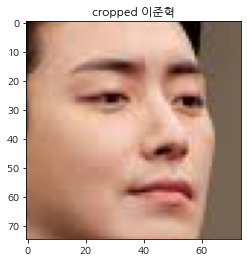

In [20]:
image = os.path.join(file_path, file)
cropped_img = get_cropped_face(image)
plt.imshow(cropped_img)
plt.title("cropped " + file_name)

#### 파일 불러오기 오류

이 부분은 노드를 하면서 생겼던 오류에 관한 내용입니다. 똑같은 파일을 face_recognition의 `load_image_file`을 사용했을 때는 잘 불러와지지만  matplotlib의 `imread`를 사용해서 불러왔을 때는 사용할 수 없는 문제가 생기는 오류입니다.

In [21]:
# file = os.path.join(file_path, file_list[0])

# image = img.imread(file)
# print(type(image))
# print(image.shape)

# image_2 = face_recognition.load_image_file(file)
# print(type(image_2))
# print(image_2.shape)

# all_zeros = not np.any(image-image_2)
# print(all_zeros)

# # imread로 읽어왔을 때는 face_locations가 안되는 오류
# # all_zeros를 통해 확인해봤을 때 두 사진은 똑같은 픽셀값을 가진다.

In [22]:
#face_locations = face_recognition.face_locations(image)
# RuntimeError: Expected writable numpy.ndarray with shape set. 가 생겨 불러올 수 없다.
# face_locations = face_recognition.face_locations(image_2)

관련해서 찾아봐야 할 링크를 정리해두겠습니다.
- [원준님이 알려주신 Duck Typing 관련 문제일 가능성](https://nesoy.github.io/articles/2018-02/Duck-Typing)
- [공식 github issues에 올라온 내용](https://github.com/ageitgey/face_recognition/issues/231)
issues를 살펴보고 `imread`와 `load_image_file` 모두 `cv2.imread`를 이용하는 것 같은데 어디가 문제인지 잘 되지 않네요. 일단은 `load_image_file`을 노드에서 사용했으므로 이 문제는 넘어가보겠습니다.

#### 시각화로 확인
위에서 불러온 사진들을 `get_cropped_face`를 통해 사진을 자른뒤에 제대로 잘렸는 지 확인해보겠습니다.

16it [00:04,  3.28it/s]


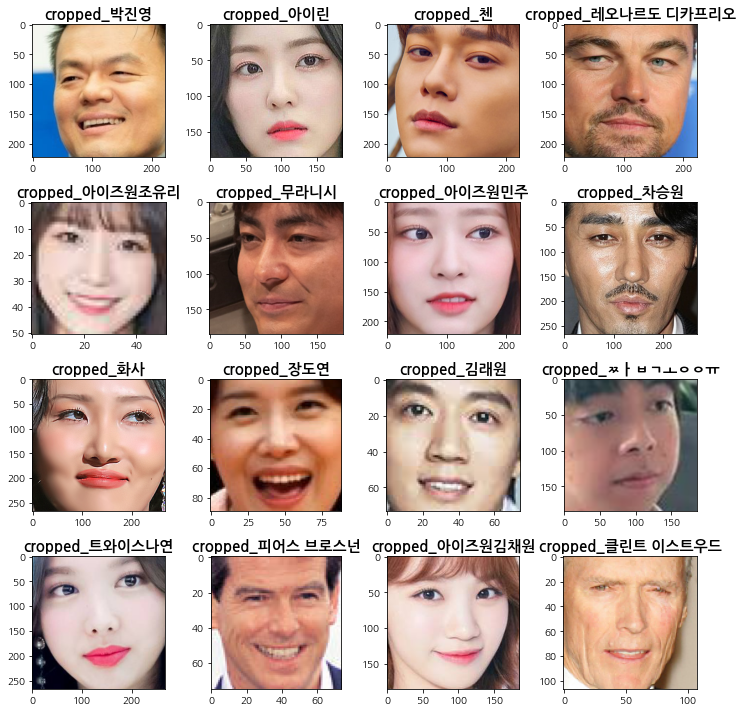

In [23]:
fig, axes = plt.subplots(nrows=4, ncols=4, figsize=(10, 10))
axs = axes.ravel()

for i, ax in tqdm(enumerate(axs)):
    
    idx = idxs[i]
    file = os.path.join(file_path, file_list[idx])
    cropped_image = get_cropped_face(file)
    ax.imshow(cropped_image)
    
    name = os.path.splitext(file_list[idx])[0]
    ax.set_title(f"cropped_{name}", fontsize=15, fontweight='bold')
    
fig.tight_layout()

### 자른 얼굴 저장하는 함수
이번엔 얼굴 부분만 잘라낸 사진을 저장하는 함수를 구현해보겠습니다. 구현 방식은 해당 파일을 자르고 제대로 잘려서 `None`을 반환한 상황이 아니라면 `PIL`을 이용해 저장할 수 있도록 구현하겠습니다.

In [24]:
def save_cropped_face(image_file:str, path_to_save="/../"):
    cropped_face = get_cropped_face(image_file)
    if cropped_face is not None:
        pillow_image = Image.fromarray(cropped_face)
        pillow_image.save(path_to_save)
    else:
        print(image_file)

~~file_list 안에서 반복하면서 위의 함수를 적용할 때 주피터 노트북에서 저장된 checkpoint가 있는 경우 오류가 생기므로 예외처리를 해주겠습니다.~~

처음부터 file_list에서 checkpoint를 제외했기 때문에 별도로 구현해주지 않아도 되는 부분입니다. 이름을 `cropped_{file_name}.png`꼴로 저장을 했기 때문에 이름은 같지만 파일형식은 다른 파일이 합쳐지는 경우가 생깁니다. 따라서 위에서 미리 확장자를 제외한 파일명을 다 다르게 수정해줬습니다.

In [25]:
for file in tqdm(file_list):
    
#     if file == ".ipynb_checkpoints":
#         continue
    file_name = os.path.splitext(file)[0]
    image_file = os.path.join(file_path, file)
    path = os.path.abspath(os.path.join(file_path, "..")) ## 상위 디렉토리 가져오기
    path_to_save = os.path.join(path, "cropped-celebrity")
    path_to_save = os.path.join(path_to_save, f"cropped_{file_name}.png")
    save_cropped_face(image_file, path_to_save)

100%|██████████| 292/292 [02:02<00:00,  2.38it/s]


성공적으로 292장 모두 저장됐는 지 확인해보겠습니다.

In [26]:
path = os.path.abspath(os.path.join(file_path, ".."))
cropped_file_path = os.path.join(path, "cropped-celebrity")
cropped_file_list = os.listdir(cropped_file_path)
print(len(cropped_file_list))

292


### face-embedding을 찾는 함수
기존의 노드 함수에서 parameter를 추가해 살짝씩 수정을 했습니다.
1. `get_face_embedding` 에 model 파라미터를 추가해 embedding을 찾지 못하는 경우 모델 사이즈를 크게 해 임베딩을 다시 찾게 만들었습니다.

2. `get_face_embedding_dict` 에 crop 파라미터를 추가해 이전 step에서 crop을 진행한 경우에는 별도로 crop을 하지않도록 수정했습니다.
crop을 진행하려면 `True`, 진행하지 않아도 되면 `False`를 넣습니다.

_함수의 인자를 path를 받기 때문에 다시 `.ipynb_checkpoints` 확장자를 건너뛰도록 구현해야 합니다. 이것도 위와 같이 인자를 path가 아니라 파일 리스트로 받으면 해결이 가능합니다._

* 추가적으로 embedding이 되지않는 파일들을 출력해 확인해보겠습니다. (확인을 해보니 embedding이 되지 않는 파일들이 있어 추후에 추가했습니다.)

In [27]:
def get_face_embedding(face: np.ndarray, model='small', num_jitters=1):
    return face_recognition.face_encodings(face, model=model, num_jitters=num_jitters)

def get_face_embedding_dict(file_path, crop=True):

    file_list = os.listdir(file_path)
    
    embedding_dict = {}
    uncropped_files = []
    
    for file in file_list:

        if file == ".ipynb_checkpoints":
            continue
            
        img_path = os.path.join(file_path, file)
        
        if crop:
            face = get_cropped_face(img_path)

        else:
            face = face_recognition.load_image_file(img_path)
        
        if face is not None:
            embedding = get_face_embedding(face)

        if len(embedding) > 0:
            embedding_dict[os.path.splitext(file)[0]] = embedding[0]

        
        else:
            embedding = get_face_embedding(face, model='large', num_jitters=15)
            if len(embedding) > 0:
                embedding_dict[os.path.splitext(file)[0]] = embedding[0]
            else:
                uncropped_files.append(file)

                
    return embedding_dict, uncropped_files

In [28]:
embedding_dict, uncropped_files = get_face_embedding_dict(file_path, crop=True)

embedding이 되지 않은 사진들이 몇개나 있는 지 확인하고 그 중 하나를 뽑아 왜 embedding이 되지 않았는지 찾아보겠습니다.

In [29]:
print(f"{len(uncropped_files)}개의 사진이 embedding을 찾지 못했습니다.")

11개의 사진이 embedding을 찾지 못했습니다.


In [30]:
uncropped_files

['sunwoong2.png',
 '신태용.jpg',
 '이승환.jpg',
 '김대명.jpeg',
 '신비.jpg',
 '매드클라운.jpeg',
 '한효주.jpg',
 '사무엘 L 잭슨.jpg',
 '제프리 힌턴.jpg',
 '도아.jpeg',
 '산들.jpeg']

In [31]:
for file in uncropped_files:
    img_path = os.path.join(file_path, file)
    face = get_cropped_face(img_path)
    large_embedding = get_face_embedding(face, model='large', num_jitters=50)
    if len(large_embedding):
        print(len(large_embedding))

embedding을 할 수 있도록 모델의 크기를 키워줘도 임베딩이 잘 되지 않는 것 같습니다. 하나씩 출력해서 어떤 특징이 있는지 확인해보겠습니다.

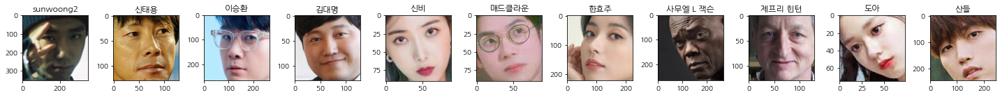

In [32]:
fig, axes = plt.subplots(nrows=1, ncols=len(uncropped_files), figsize=(20, 20))
axs = axes.ravel()
for idx, file in enumerate(uncropped_files):
    name = os.path.splitext(file)[0]
    img_path = os.path.join(file_path, file)
    face = get_cropped_face(img_path)
    axs[idx].imshow(face)
    axs[idx].set_title(f"{name}")

plt.tight_layout()

마땅한 특징을 파악할 수는 없습니다. 다만 임베딩이 되지 않는 경우 얼굴을 포함하는 bounding box의 좌표를 `knonw_face_locations` 파라미터에 넘겨줘 사용할 수 있습니다. 아래에서 별도로 다뤄보겠습니다.

### 사진간의 거리를 구하는 함수

In [33]:
def get_distance(name1, name2):
    return np.linalg.norm(embedding_dict[name1]-embedding_dict[name2], ord=2)

def get_sort_key_func(name1):
    def get_distance_from_name1(name2):
        return get_distance(name1, name2)
    return get_distance_from_name1

In [34]:
def get_nearest_face(name, top=5):
    sort_key_func = get_sort_key_func(name)
    sorted_faces = sorted(embedding_dict.items(), key=lambda x:sort_key_func(x[0]))
    
    for i in range(top+1):
        if i == 0:
            continue
        if sorted_faces[i]:
            print(f"순위 {i}: 이름({sorted_faces[i][0]}), 거리({sort_key_func(sorted_faces[i][0])})")

위의 두 함수를 통해 triplet loss 기반의 거리를 구할 수 있습니다. 각 함수는 노드에서 구현한 함수를 그대로 사용했습니다.

## 닮은꼴을 찾아보자

이번에는 앞에서 저장해놓은 잘라놓은 사진들을 embedding 해보겠습니다.

In [35]:
path = os.path.abspath(os.path.join(file_path, ".."))
cropped_file_path = os.path.join(path, "cropped-celebrity")
cropped_file_list = os.listdir(cropped_file_path)

In [36]:
cropped_file_path

'/aiffel/aiffel/exploration-5-face-recognition/data/cropped-celebrity'

In [37]:
cropped_embedding_dict, _ = get_face_embedding_dict(cropped_file_path, crop=False)

In [38]:
print(len(cropped_embedding_dict)) ## 이건 왜 또 10개 줄어들었을까?
print(len(embedding_dict))

281
281


본격적으로 닮은 꼴을 찾기 전에 제 사진들끼리 비교하면서 어느 정도의 거리가 나오는 지 확인해보겠습니다.

이 과정을 통해 '닮았다'의 기준을 대충 잡아볼 수 있을 것 같습니다.

In [39]:
get_nearest_face('sunwoong1', top=5)

순위 1: 이름(sunwoong3), 거리(0.3904414823991378)
순위 2: 이름(이종석), 거리(0.48896435923357623)
순위 3: 이름(김연우), 거리(0.49480929316643457)
순위 4: 이름(서장훈), 거리(0.5086611178176764)
순위 5: 이름(목진화), 거리(0.5147430534727037)


In [40]:
get_nearest_face('박진영', top=5)

순위 1: 이름(박진영2), 거리(0.3931346150741491)
순위 2: 이름(김구라), 거리(0.4512501109743717)
순위 3: 이름(이영하), 거리(0.472835413722818)
순위 4: 이름(방시혁), 거리(0.47977137131558684)
순위 5: 이름(목진화), 거리(0.4812325272938919)


2번째 사진은 아얘 embedding이 되지않은 걸 감안하면 아마 0.39정도 나오면 매우 닮은 사진으로 이해할 수 있을 것 같습니다. 다만 사진이 안경을 끼고, 안 끼고의 차이가 있습니다. 하지만 박진영의 걍우도 본인간의 사진 거리가 0.39정도 인걸로 보아 이정도를 베이스라인으로 잡을 수 있을 것 같습니다.

닮은꼴을 찾아서 사진을 직접 보면서 확인해보겠습니다.

In [41]:
def get_nearest_face_vis(name, top=5):
    
    sort_key_func = get_sort_key_func(name)
    sorted_faces = sorted(embedding_dict.items(), key=lambda x:sort_key_func(x[0]))
    
    fig, axes = plt.subplots(nrows=1, ncols=top+1, figsize=(20, 50))
    axs = axes.ravel()
    
    for file in file_list:
        if name in file:
            name_path = file
        
    image_path = os.path.join(file_path, name_path)
    sample_image = Image.open(image_path)
    axs[0].imshow(np.asarray(sample_image))
    axs[0].set_title(f"Original face: {name}", fontweight='bold')
    
    for i in range(1, top+1):
        if sorted_faces[i]:
            for file in file_list:
                if sorted_faces[i][0] in file:
                    image_path = file
            
            image_path = os.path.join(file_path, image_path)
            #sample_image = img.imread(os.path.join(file_path, image_path))
            sample_image = Image.open(image_path)
            axs[i].imshow(np.asarray(sample_image))
            axs[i].set_title(f"{i}번째로 닮은 {sorted_faces[i][0]}, {sort_key_func(sorted_faces[i][0]):.3f}")

                
    plt.tight_layout()
            

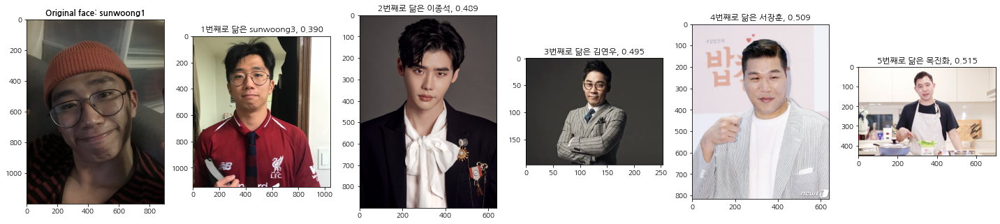

In [42]:
get_nearest_face_vis('sunwoong1', top=5)

여러명의 사진을 한번에 뽑아보면서 닮은 사람을 잘 찾는 지 살펴보겠습니다.

In [43]:
embedded_files = list(embedding_dict.keys())

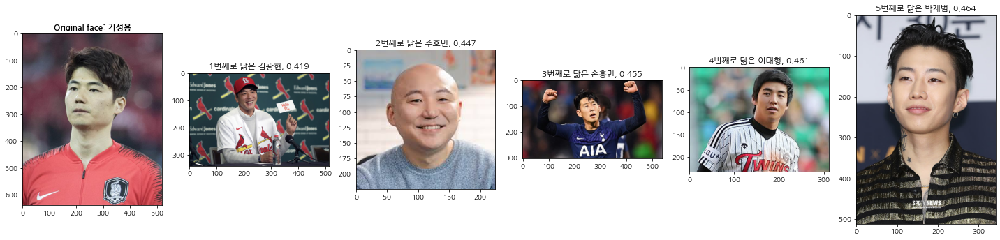

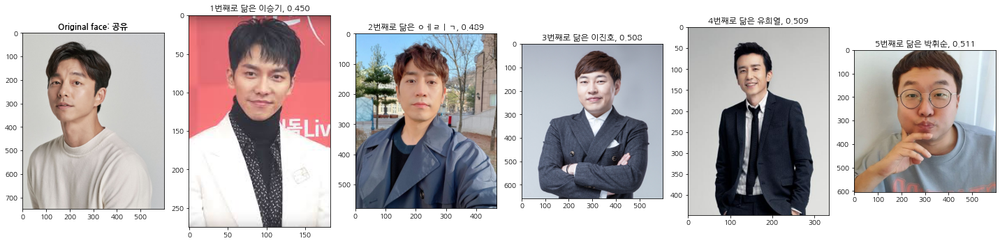

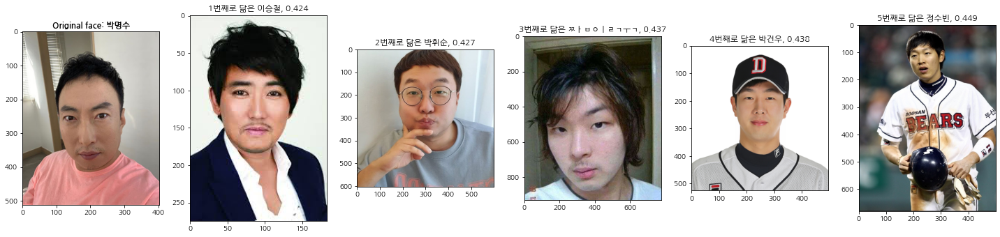

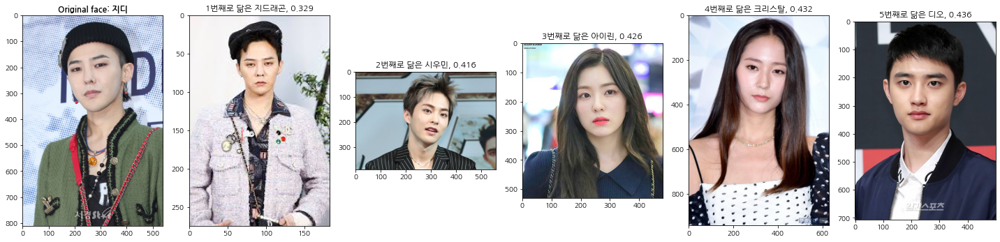

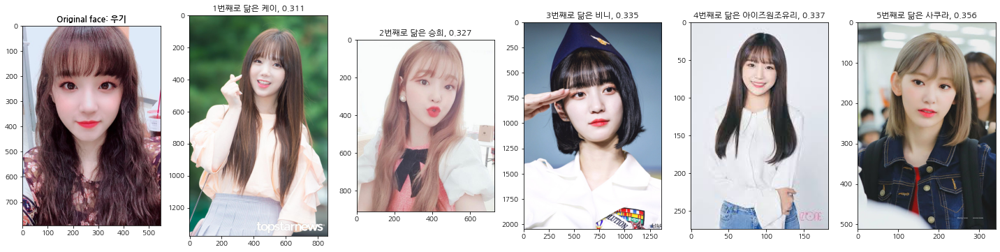

In [44]:
rng = np.random.default_rng(123)
idxs = rng.choice(len(embedded_files), 5, replace=False)
for idx in idxs:
    get_nearest_face_vis(embedded_files[idx], top=5)

엄청 잘 찾는 것 같네요. 지드래곤과 지디도 기깔나게 찾는 걸 보면 어느정도 쓸모가 있는 것 같습니다. 박명수와 닮은 사람을 찾는 3번째 경우를 보면 제가 임의로 넣은 짭일국이 있습니다. 인터넷에 억울하게 송일국 닮은 사진으로 유명했었는데 실제 송일국씨와 비교해보겠습니다.

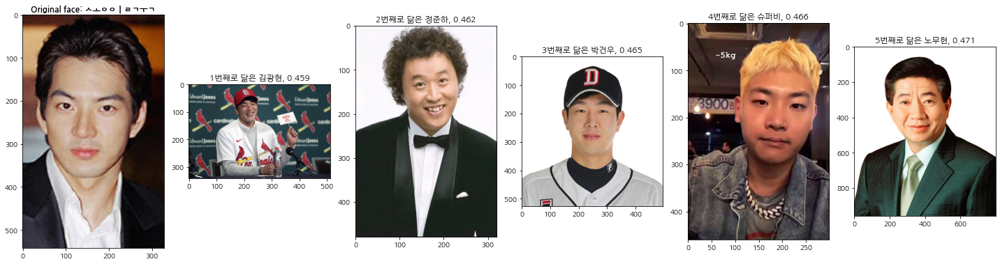

In [45]:
get_nearest_face_vis("송일국", top=5)

사실은 별로 안 닮았다고 계산이 나오는군요.

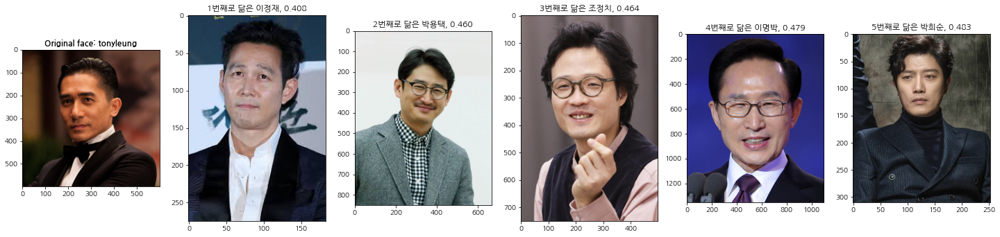

In [46]:
get_nearest_face_vis("tonyleung", top=5)

제가 좋아하는 양조위 배우의 사진을 사용해봤는데, 이정재 배우는 그렇다 해도 그 다음 몇명은 그다지 닮지 않은 것 같은데 살짝 미소를 띄고 있는 모습이 닮아서 높은 순위를 차지한 모습입니다.

### Cropped version
얼굴만 볼 수 있으면 좋을 것 같아 크롭된 사진을 사용하는 버전의 함수를 조금씩 수정해 만들어봤습니다.

In [47]:
def c_get_distance(name1, name2):
    return np.linalg.norm(cropped_embedding_dict[name1]-cropped_embedding_dict[name2], ord=2)

def c_get_sort_key_func(name1):
    def c_get_distance_from_name1(name2):
        return c_get_distance(name1, name2)
    return c_get_distance_from_name1

In [48]:
def c_get_nearest_face(name, top=5):
    sort_key_func = c_get_sort_key_func(name)
    sorted_faces = sorted(cropped_embedding_dict.items(), key=lambda x:sort_key_func(x[0]))
    
    for i in range(top+1):
        if i == 0:
            continue
        if sorted_faces[i]:
            print(f"순위 {i}: 이름({sorted_faces[i][0]}), 거리({sort_key_func(sorted_faces[i][0])})")

In [49]:
def c_get_nearest_face_vis(name, top=5):
    
    name = 'cropped_' + name
    sort_key_func = c_get_sort_key_func(name)
    sorted_faces = sorted(cropped_embedding_dict.items(), key=lambda x:sort_key_func(x[0]))
    
    fig, axes = plt.subplots(nrows=1, ncols=top+1, figsize=(20, 35))
    axs = axes.ravel()
    
    for file in cropped_file_list:
        if name in file:
            name_path = file
        
    image_path = os.path.join(cropped_file_path, name_path)
    sample_image = Image.open(image_path)
    axs[0].imshow(np.asarray(sample_image))
    axs[0].set_title(f"Original face: {name}", fontweight='bold')
    
    for i in range(1, top+1):
        if sorted_faces[i]:
            for file in cropped_file_list:
                if sorted_faces[i][0] in file:
                    image_path = file
            
            image_path = os.path.join(cropped_file_path, image_path)
            #sample_image = img.imread(os.path.join(file_path, image_path))
            sample_image = Image.open(image_path)
            axs[i].imshow(np.asarray(sample_image))
            axs[i].set_title(f"{i}번째로 닮은 {sorted_faces[i][0]}, {sort_key_func(sorted_faces[i][0]):.3f}")

                
    plt.tight_layout()
            

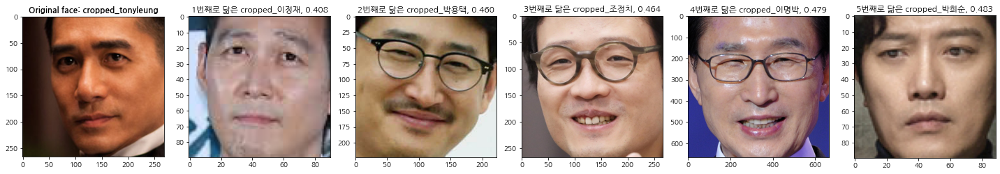

In [50]:
c_get_nearest_face_vis('tonyleung', top=5)

### Embedding을 찾지 못한 사진들
아까 Embedding을 찾지 못한 사진들을 다시 한번 처리해보겠습니다.

In [51]:
uncropped_files

['sunwoong2.png',
 '신태용.jpg',
 '이승환.jpg',
 '김대명.jpeg',
 '신비.jpg',
 '매드클라운.jpeg',
 '한효주.jpg',
 '사무엘 L 잭슨.jpg',
 '제프리 힌턴.jpg',
 '도아.jpeg',
 '산들.jpeg']

In [52]:
for file in uncropped_files:
    img_path = os.path.join(file_path, file)
    face = get_cropped_face(img_path)
    large_embedding = get_face_embedding(face, model='large', num_jitters=50)
    if len(large_embedding):
        print(len(large_embedding))

embedding을 할 수 있도록 모델의 크기를 키워줘도 임베딩이 잘 되지 않는 것 같습니다. 하나씩 출력해서 어떤 특징이 있는지 확인해보겠습니다.

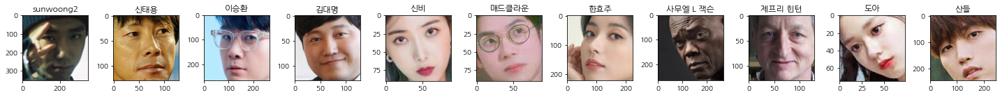

In [53]:
fig, axes = plt.subplots(nrows=1, ncols=len(uncropped_files), figsize=(20, 20))
axs = axes.ravel()
for idx, file in enumerate(uncropped_files):
    name = os.path.splitext(file)[0]
    img_path = os.path.join(file_path, file)
    face = get_cropped_face(img_path)
    axs[idx].imshow(face)
    axs[idx].set_title(f"{name}")

plt.tight_layout()

위에서 해온 과정을 그대로 가져왔습니다. 얼굴을 포함하는 bounding box의 좌표를 `face_encodings`의 `knonw_face_locations` 파라미터에 넘겨줘 사용해보겠습니다. 대략적인 사진의 사이즈를 각 좌표로 잡고 넘겨줬을 때 어떻게 되나 한번 해보겠습니다. 좌표를 개략적으로 잡기 위해 각 잘린 사진을 포함할 수 있도록 가장 큰 길이를 찾아주겠습니다. (지은님이 도와주셨습니다.)

In [54]:
size_list = []

for idx, file in enumerate(uncropped_files):
    img_path = os.path.join(file_path, file)
    face = get_cropped_face(img_path)
    size_list.append(face.shape[0])
    
max_h = max(size_list)

print(max_h)

352


In [55]:
new_embedding_dict = embedding_dict.copy()

In [56]:
id(embedding_dict) == id(new_embedding_dict)

False

In [57]:
locations = [(0, max_h, max_h, 0)] # top, right, bottom, left
for file in uncropped_files:
    img_path = os.path.join(file_path, file)
    name = os.path.splitext(file)[0]
    face = get_cropped_face(img_path)
    large_embedding = face_recognition.face_encodings(face, model="small", num_jitters=1, known_face_locations=locations)
    new_embedding_dict[name] = large_embedding[0]

위 사진들을 추가한 `new_embedding_dict`를 이용해 다시 한번 닮은꼴을 찾아보겠습니다.

In [58]:
def n_get_distance(name1, name2):
    return np.linalg.norm(new_embedding_dict[name1]-new_embedding_dict[name2], ord=2)

def n_get_sort_key_func(name1):
    def n_get_distance_from_name1(name2):
        return n_get_distance(name1, name2)
    return n_get_distance_from_name1

In [59]:
def n_get_nearest_face(name, top=5):
    sort_key_func = n_get_sort_key_func(name)
    sorted_faces = sorted(new_embedding_dict.items(), key=lambda x:sort_key_func(x[0]))
    
    for i in range(top+1):
        if i == 0:
            continue
        if sorted_faces[i]:
            print(f"순위 {i}: 이름({sorted_faces[i][0]}), 거리({sort_key_func(sorted_faces[i][0])})")

In [60]:
n_get_nearest_face('sunwoong2', top=5) 

순위 1: 이름(김대명), 거리(0.505802170383012)
순위 2: 이름(차범근), 거리(0.5065218319705289)
순위 3: 이름(신태용), 거리(0.5310061648938966)
순위 4: 이름(성룡), 거리(0.541709750212866)
순위 5: 이름(황병국), 거리(0.5459929200573865)


In [61]:
n_get_nearest_face('한효주', top=5)

순위 1: 이름(아린), 거리(0.46537734416867366)
순위 2: 이름(손예진), 거리(0.4818819552003203)
순위 3: 이름(지수), 거리(0.4870731783230673)
순위 4: 이름(류진), 거리(0.497380169401794)
순위 5: 이름(지호), 거리(0.5018710928150759)


In [62]:
n_get_nearest_face('사무엘 L 잭슨', top=5)

순위 1: 이름(홍구), 거리(0.6862139914200647)
순위 2: 이름(김대명), 거리(0.7119834418000862)
순위 3: 이름(신태용), 거리(0.7206945774890776)
순위 4: 이름(제프리 힌턴), 거리(0.7311826222393091)
순위 5: 이름(드웨인 존슨), 거리(0.7366148809374435)


In [63]:
n_get_nearest_face('도아', top=5)

순위 1: 이름(신비), 거리(0.039365843363533805)
순위 2: 이름(매드클라운), 거리(0.04526687141120946)
순위 3: 이름(제프리 힌턴), 거리(0.1097300491270679)
순위 4: 이름(김대명), 거리(0.18291135645997406)
순위 5: 이름(신태용), 거리(0.19949288897786466)


똑같은 방법으로 시각화도 해보겠습니다.

In [64]:
def n_get_nearest_face_vis(name, top=5):
    
    sort_key_func = n_get_sort_key_func(name)
    sorted_faces = sorted(new_embedding_dict.items(), key=lambda x:sort_key_func(x[0]))
    
    fig, axes = plt.subplots(nrows=1, ncols=top+1, figsize=(20, 50))
    axs = axes.ravel()
    
    for file in file_list:
        if name in file:
            name_path = file
        
    image_path = os.path.join(file_path, name_path)
    sample_image = Image.open(image_path)
    axs[0].imshow(np.asarray(sample_image))
    axs[0].set_title(f"Original face: {name}", fontweight='bold')
    
    for i in range(1, top+1):
        if sorted_faces[i]:
            for file in file_list:
                if sorted_faces[i][0] in file:
                    image_path = file
            
            image_path = os.path.join(file_path, image_path)
            #sample_image = img.imread(os.path.join(file_path, image_path))
            sample_image = Image.open(image_path)
            axs[i].imshow(np.asarray(sample_image))
            axs[i].set_title(f"{i}번째로 닮은 {sorted_faces[i][0]}, {sort_key_func(sorted_faces[i][0]):.3f}")

                
    plt.tight_layout()
            

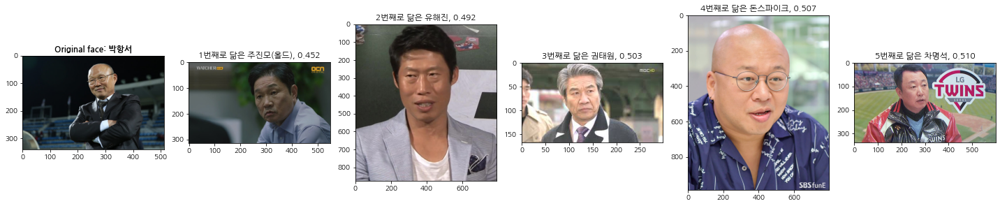

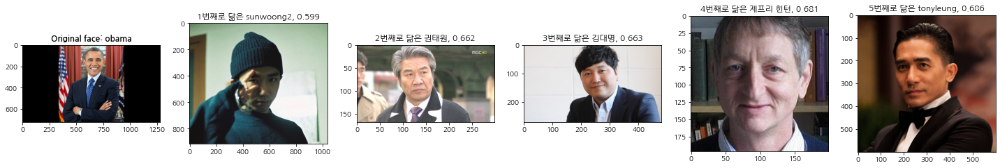

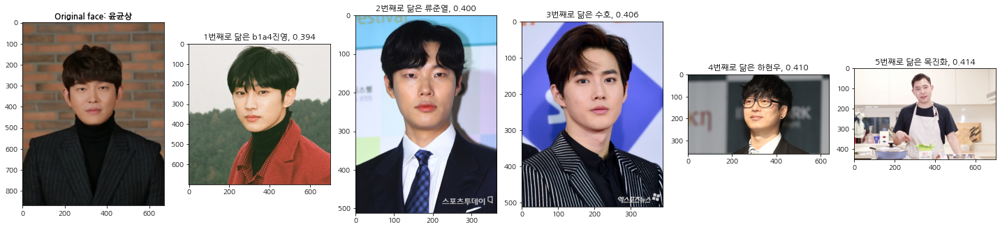

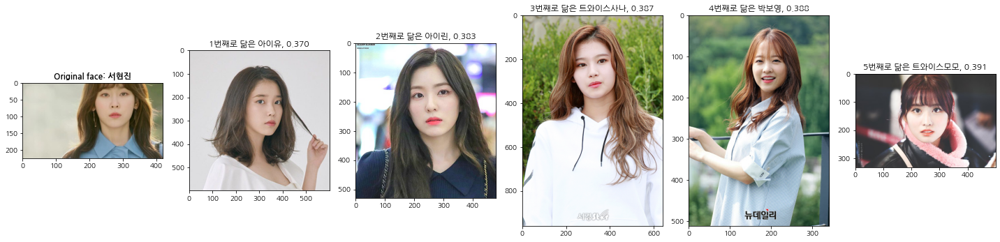

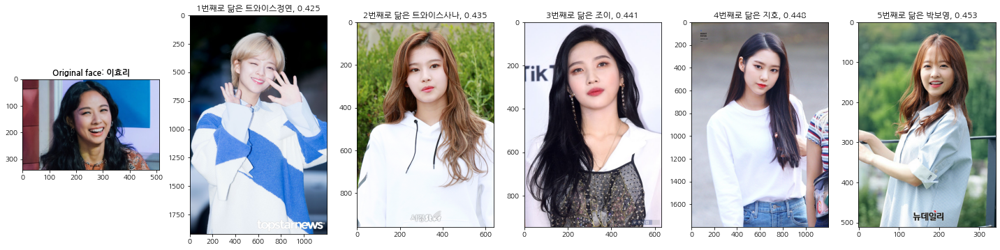

In [65]:
rng = np.random.default_rng(22)
idxs = rng.choice(len(new_embedding_dict), 5, replace=False)
for idx in idxs:
    n_get_nearest_face_vis(embedded_files[idx], top=5)

### 재밌는 시각화
닮은꼴들끼리 얼마나 닮았는 지 얼굴을 한번 합쳐보겠습니다. 얼굴만 합칠 것이므로 잘라서 저장해놓은 사진을 사용하겠습니다.

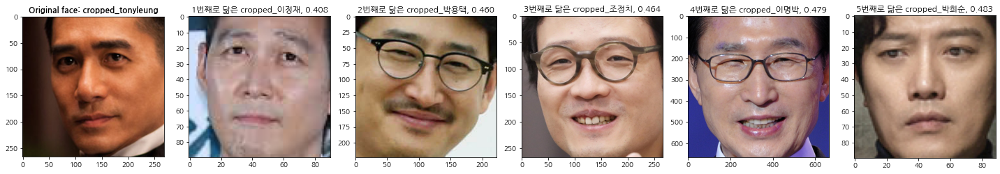

In [66]:
c_get_nearest_face_vis('tonyleung', top=5)

In [67]:
def path_finder(name):
    for file in cropped_file_list:
        if name in file:
            return os.path.join(cropped_file_path, file)

In [75]:
tony_path = path_finder("tonyleung")
re_path = path_finder("조정치")
print(tony_path)
print(re_path)

/aiffel/aiffel/exploration-5-face-recognition/data/cropped-celebrity/cropped_tonyleung.png
/aiffel/aiffel/exploration-5-face-recognition/data/cropped-celebrity/cropped_조정치.png


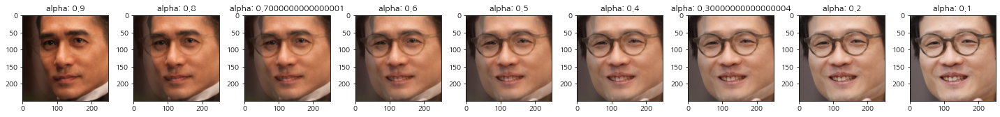

In [96]:
import cv2
import numpy as np


img1 = cv2.imread(tony_path)
img2 = cv2.imread(re_path)
img1 = cv2.resize(img1, (250, 250))
img2 = cv2.resize(img2, (250, 250))


alphas = np.arange(0.1,1,0.1)[::-1]
fig, axes = plt.subplots(nrows=1, ncols=len(alphas), figsize=(20, 50))
axs = axes.ravel()

for idx, alpha in enumerate(alphas):
    dst = cv2.addWeighted(img1, alpha, img2, (1-alpha), 0) 
    axs[idx].imshow(cv2.cvtColor(dst, cv2.COLOR_BGR2RGB))
    axs[idx].set_title(f"alpha: {alpha}")

fig.tight_layout()  


이렇게 보니 그럴듯 해보이네요. 몇장 더 해보겠습니다. 몇장 더 해보기 위해 함수로 만들어주겠습니다.

In [120]:
def look_like_transform(image1, image2, flip=False):
    
    path1 = path_finder(image1)
    path2 = path_finder(image2)

    img1 = cv2.imread(path1)
    img2 = cv2.imread(path2)
    img1 = cv2.resize(img1, (250, 250))
    img2 = cv2.resize(img2, (250, 250))

    if flip:
        img1 = cv2.flip(img1, 1)
    
    alphas = np.arange(0.1,1,0.1)[::-1]
    fig, axes = plt.subplots(nrows=1, ncols=len(alphas), figsize=(20, 50))
    axs = axes.ravel()

    for idx, alpha in enumerate(alphas):
        dst = cv2.addWeighted(img1, alpha, img2, (1-alpha), 0) 
        axs[idx].imshow(cv2.cvtColor(dst, cv2.COLOR_BGR2RGB))
        axs[idx].set_title(f"alpha: {alpha:.1f}")

    fig.tight_layout()  


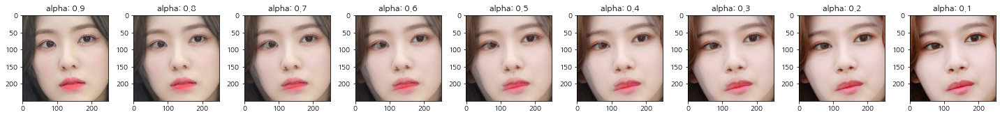

In [122]:
look_like_transform("아이린", "사나")

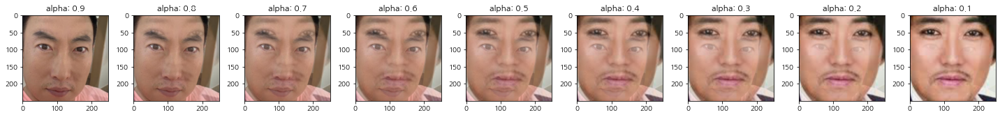

In [123]:
look_like_transform("박명수", "이승철", flip=True)

높이가 안 맞아서 조금 보기 힘들게 나왔네요.

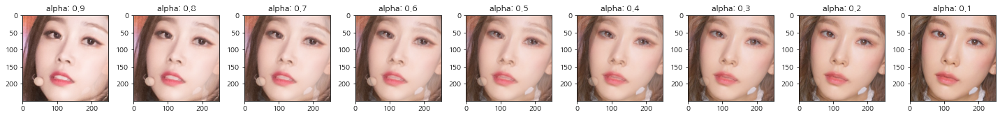

In [137]:
look_like_transform("러블리즈지수", "태연")

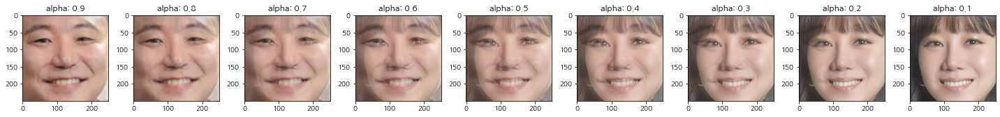

In [142]:
look_like_transform("주호민", "공효진")

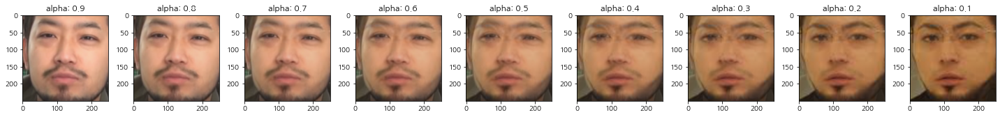

In [146]:
look_like_transform("이말년", "야마다 타카유키")

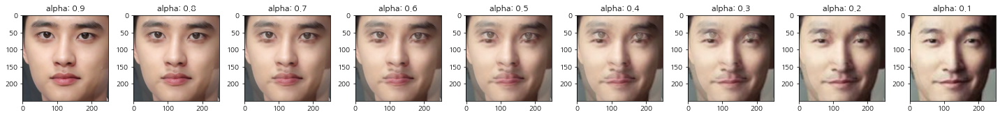

In [148]:
look_like_transform("디오", "조승우")

### 소감

임베딩이 잘 되면 더 잘 닮게 나올 것 같습니다. 자연어처리에서 단어를 임베딩을 얼마나 잘하냐에 따라 성능이 달라지는 것 처럼 조금 더 좋은 pre-trained 모델을 사용하면 더 성능이 좋게 찾을 수 있지 않을까 싶습니다. 이번 노드를 진행하며 해결하지 못한 문제점은 다음과 같습니다.

1. 인코딩문제로 파일이 깨지는 현상 (ex: 공유 -> ㄱ ㅗ ㅇ ㅇ ㅠ) :
이는 저장방식과 관련이 있는 문제로 위에 별도로 링크를 해뒀습니다. 여러가지 시도를 했지만 그때마다 다른 문제가 생겨 우선은 그대로 놔뒀지만 추후에 해결해야합니다.


2. 파일의 이름으로 파일을 찾는 방식
```
for file in cropped_file_list:
    if name in file:
        return os.path.join(cropped_file_path, file)
```
와 같은 방식으로 file을 찾는데 이런 방식을 사용하면 '진'을 찾고 싶은 경우에 '류__진__'을 먼저 찾을 수도 있습니다. 따라서 다양한 확장자를 합쳐 일치하는 것이 있는 걸 찾는 방식을 선택할 수 있고 정규표현식을 이용해 개선을 하는 것이 좋을 것 같습니다.


3. 반복되는 함수선언
`get_nearest_face_vis`의 경우에도 `c_get_nearest_face_vis`, `n_get_nearest_face_vis` 등의 변형이 있지만 결국은 함수 내부에서 임베딩 딕셔너리로 무엇을 참조하느냐에 따라 다르게 짜여진 함수입니다. 따라서 임베딩 벡터를 사용하는 `get_distance` 함수등에 dictionary를 별도로 인자로 넣어주는 방향으로 개선하는 것이 좋을 것 같습니다.


눈으로 결과가 바로 보이는 구현이라 재밌게 했던 것 같습니다.